In [1]:
import matplotlib.patches as patches
import matplotlib.colors as mcolors
import matplotlib.animation as ma
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from itertools import product
import pandas as pd
import numpy as np
import numba as nb
import imageio
import os
import shutil
import sys
sys.path.append("..")

randomSeed = 100

%matplotlib inline
%config InlineBackend.figure_format = "retina"

new_cmap = mcolors.LinearSegmentedColormap.from_list(
    "new", plt.cm.jet(np.linspace(0, 1, 256)) * 0.85, N=256
)

@nb.njit
def colors_idx(phaseTheta):
    return np.floor(256 - phaseTheta / (2 * np.pi) * 256).astype(np.int32)

import seaborn as sns

sns.set_theme(
    style="ticks", 
    font_scale=1.1, rc={
    'figure.figsize': (6, 5),
    'axes.facecolor': 'white',
    'figure.facecolor': 'white',
    'grid.color': '#dddddd',
    'grid.linewidth': 0.5,
    "lines.linewidth": 1.5,
    'text.color': '#000000',
    'figure.titleweight': "bold",
    'xtick.color': '#000000',
    'ytick.color': '#000000',
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    # 'axes.spines.right': False,
    # 'axes.spines.top': False,
    'axes.grid': True,
})

plt.rcParams['mathtext.fontset'] = 'cm'
plt.rcParams['font.family'] = 'STIXGeneral'
# plt.rcParams['animation.ffmpeg_path'] = "/opt/conda/bin/ffmpeg"

from PJT_Frustration_Induced_Crystallize.main import *
from multiprocessing import Pool
import pandas as pd

colors = ["#403990", "#3A76D6", "#FFC001", "#F46F43", "#FF0000"]
cmap = mcolors.LinearSegmentedColormap.from_list("cmap", colors)
cmap_r = mcolors.LinearSegmentedColormap.from_list("my_colormap", colors[::-1])
new_cmap = mcolors.LinearSegmentedColormap.from_list(
    "new", plt.cm.hsv(np.linspace(0, 1, 256)) * 0.85, N=256
)

SAVE_PATH = r"F:\MS_ExperimentData\general"
MP4_PATH = r"F:\MS_ExperimentData\mp4"

# SAVE_PATH = r"D:\MS_ExperimentData\general"
# MP4_PATH = r"D:\MS_ExperimentData\mp4"

# LOCAL_FIG_PATH = "./PCT_C_figs"
LOCAL_FIG_PATH = "./figs"

In [17]:
model = PhaseLagPatternFormation(
    strengthK=10.5, distanceD0=1.067, phaseLagA0=0.6 * np.pi,
    omegaMin=0, deltaOmega=0,
    agentsNum=3000, dt=0.005,
    tqdm=True, savePath=SAVE_PATH, shotsnaps=10, 
    randomSeed=10, overWrite=False
)
sa = StateAnalysis(model)

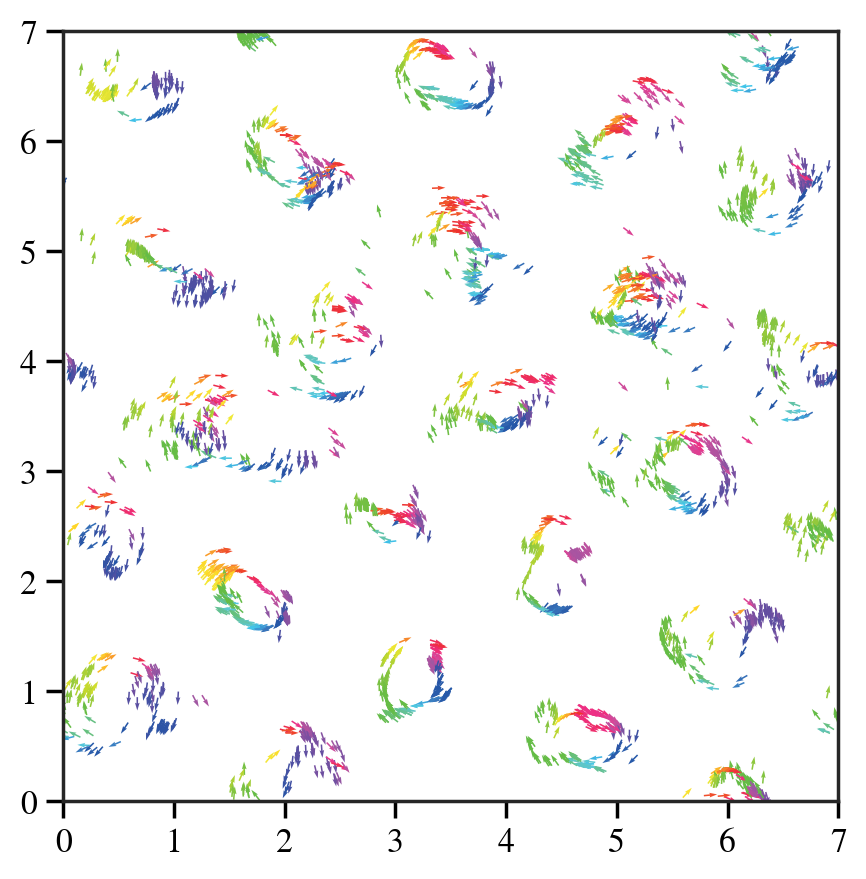

In [19]:
sa.plot_spatial(index=3000)

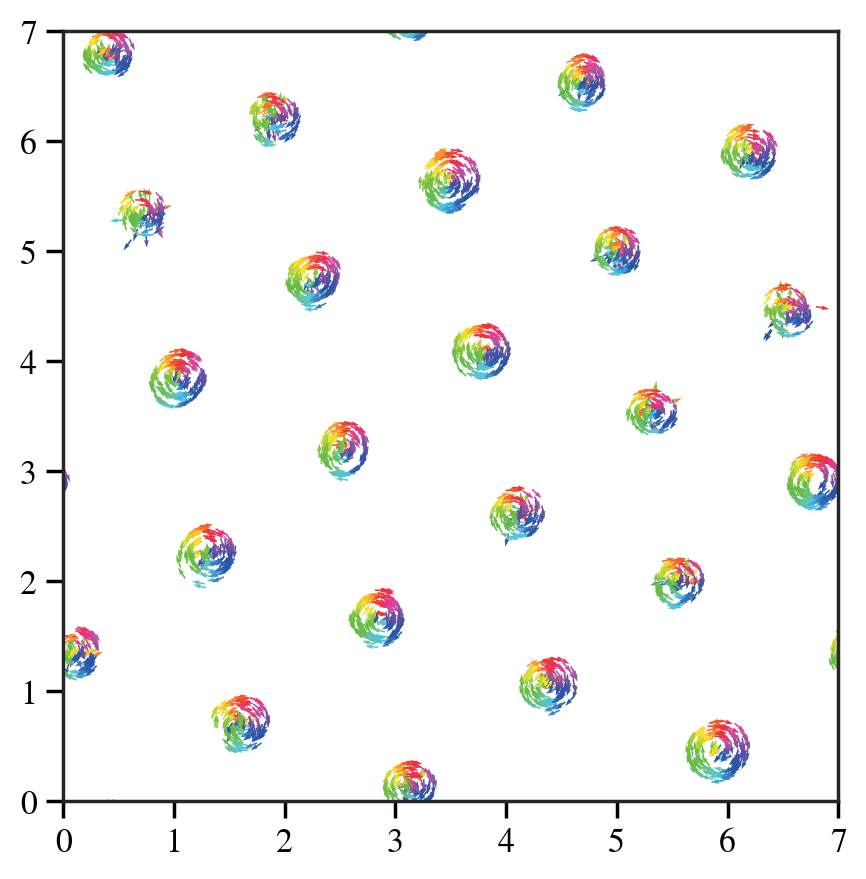

In [16]:
sa.plot_spatial(index=6000)

In [4]:
sa.TNum

16002

In [3]:
model.run(30000)

F:\MS_ExperimentData\general/PhaseLagPatternFormation(strengthK=10.500,distanceD0=1.067,phaseLagA0=1.885,boundaryLength=7.0,speedV=3.0,freqDist=uniform,omegaMin=0.000,deltaOmega=0.000,agentsNum=3000,dt=0.005,shotsnaps=10,randomSeed=10).h5 already exists, but has only 2081 snapshots, will continue to run until 3002 snapshots.


  0%|          | 0/9209 [00:00<?, ?it/s]

In [6]:
shift = np.array([0., 0.])

classes, centers = sa.calc_classes_and_centers(classDistance=0.5, lookIdx=-1)
centers = np.mod(centers + shift, model.boundaryLength)

classCenters: List[np.ndarray] = []
for c in classes:
    singleClassCenters = centers[c]

    maxDeltaX = np.abs(singleClassCenters[:, 0] - singleClassCenters[:, 0, np.newaxis]).max()
    subXShift = model.halfBoundaryLength if maxDeltaX > model.halfBoundaryLength else 0
    maxDeltaY = np.abs(singleClassCenters[:, 1] - singleClassCenters[:, 1, np.newaxis]).max()
    subYShift = model.halfBoundaryLength if maxDeltaY > model.halfBoundaryLength else 0

    singleClassCenters = np.mod(singleClassCenters - np.array([subXShift, subYShift]), model.boundaryLength)
    classCenter = np.mod(singleClassCenters.mean(axis=0) + np.array([subXShift, subYShift]), model.boundaryLength)
    classCenters.append(classCenter)
classCenters: np.ndarray = np.array(classCenters)

edges, ajdClassCenters = sa.calc_nearby_edges(classCenters=classCenters, stdMulti=0.3)

In [5]:
reduceModels = list()

for classIdx in tqdm(range(len(classes))):

    reduceModel = PhaseLagPatternFormation(
        strengthK=model.strengthK, distanceD0=model.distanceD0, 
        phaseLagA0=model.phaseLagA0,
        # initPhaseTheta=np.zeros(1000), 
        omegaMin=0, deltaOmega=0,
        agentsNum=len(classes[classIdx]), dt=0.001,
        tqdm=True, savePath=SAVE_PATH, shotsnaps=10, 
        randomSeed=classIdx, overWrite=False
    )

    subIndexs = classes[classIdx]

    reduceModel.positionX = sa.totalPositionX[-1][subIndexs].copy()
    reduceModel.phaseTheta = sa.totalPhaseTheta[-1][subIndexs].copy()
    reduceModel.freqOmega = sa.model.freqOmega[subIndexs].copy()
    reduceModel.agentsNum = len(subIndexs)
    # reduceModel.run(80000)
    reduceModels.append(reduceModel)

reduceSas = [StateAnalysis(reduceModel) for reduceModel in tqdm(reduceModels)]

  0%|          | 0/23 [00:00<?, ?it/s]

In [ ]:
totalTvRadius = list()
totalReduceTvRadius = list()
step = 10

for idx, singleClass in enumerate(classes):
    subPositionX = sa.totalPositionX[::step, singleClass, :]
    reducePosX = reduceSas[idx].totalPositionX[::step, :, :]
    classCenter = classCenters[idx]
    tvMaxRadius = sa.calc_replative_distance(subPositionX, classCenter).mean(axis=1)
    reduceTvMaxRadius = sa.calc_replative_distance(reducePosX, classCenter).mean(axis=1)
    totalTvRadius.append(tvMaxRadius)
    totalReduceTvRadius.append(reduceTvMaxRadius)

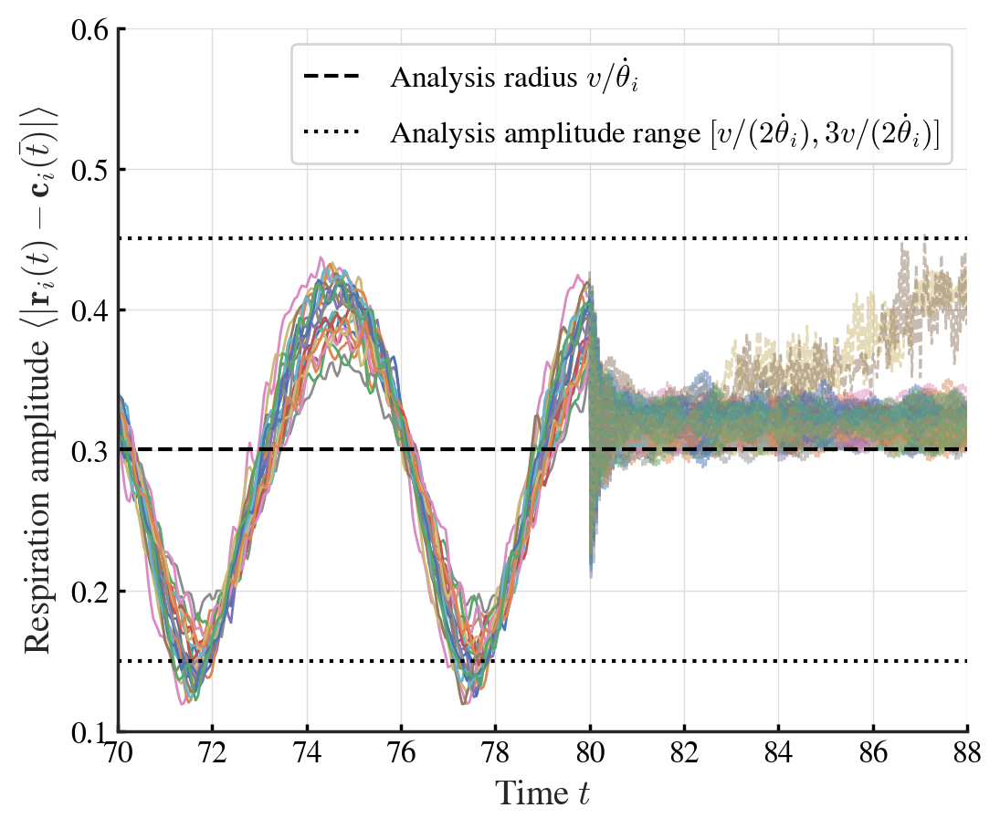

In [ ]:
analysisRadius = model.speedV / np.abs(model.strengthK * np.sin(model.phaseLagA0))
tRanges = (np.arange(0, len(totalTvRadius[0])) * model.shotsnaps * model.dt)
reduceTRanges = (np.arange(0, len(totalReduceTvRadius[0])) * reduceModels[0].shotsnaps * reduceModels[0].dt) + tRanges.max()

for i, tvRadius in enumerate(totalTvRadius[:]):
    plt.plot(tRanges, tvRadius, alpha=1, lw=1, color=f"C{i}")
    plt.plot(reduceTRanges, totalReduceTvRadius[i], alpha=0.5, lw=1, color=f"C{i}", ls="--")

plt.axhline(analysisRadius, color="black", lw=1.5, ls="--", label=r"Analysis radius $v/\dot{\theta}_i$")
plt.axhline(analysisRadius * 0.5, color="black", lw=1.5, ls=":")
plt.axhline(analysisRadius * 1.5, color="black", lw=1.5, ls=":", 
            label=r"Analysis amplitude range $[v/(2\dot{\theta}_i), 3v/(2\dot{\theta}_i)]$")
# plt.xlim(0, len(totalTvRadius[0]) - 1)
plt.tick_params(length=3, direction="in")
plt.xlabel("Time $t$", fontsize=14)
plt.ylabel(r"Respiration amplitude $\left< \left| \mathbf{r}_i(t)-\mathbf{c}_i(\bar{t}) \right| \right> $", fontsize=14)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.grid()
plt.xlim(70, 88)
plt.ylim(0.1, 0.6)
plt.legend(fontsize=12)
plt.savefig("figs/respiration_amplitude_cells_decouled.pdf", bbox_inches="tight")

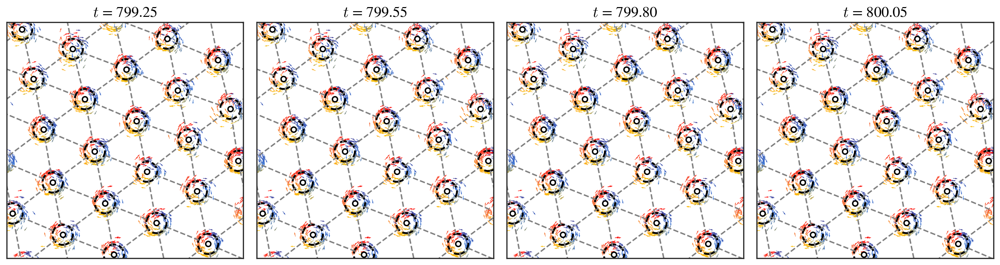

In [23]:
# fig, ax = plt.subplots(figsize=(5, 5))
indexs = [-17, -11, -6, -1]
colNum = len(indexs)
fig, axs = plt.subplots(1, colNum, figsize=(colNum * 4 - 1, 4))
analysisRadius = model.speedV / np.abs(model.strengthK * np.sin(model.phaseLagA0))

for i in range(len(indexs)):
    ax = axs[i]
    for reduceSa in reduceSas:
        reduceSa.plot_spatial(index=-1, ax=ax)
    # sa.plot_spatial(ax=ax, colorsBy="phase", index=indexs[i], shift=shift)
    ax.scatter(
        classCenters[:, 0], classCenters[:, 1],
        facecolor="white", s=30, edgecolor="black", lw=1.5
    )
    for classCenter in classCenters:
        circle = plt.Circle(
            classCenter, analysisRadius * 1, color="black", fill=False, lw=2, alpha=1, ls="--"
        )
        ax.add_artist(circle)
    # for edge in edges:
    #     ax.plot(ajdClassCenters[edge, 0], ajdClassCenters[edge, 1],
    #             color="black", lw=1.2, alpha=0.3, linestyle=(0, (10, 2)), zorder=0)
    for edge in edges:
        # plt.plot(ajdClassCenters[edge, 0], ajdClassCenters[edge, 1],
        #          color="black", lw=1.2, alpha=0.3, linestyle=(0, (10, 2)), zorder=0)
        edgeCenter = (ajdClassCenters[edge[0]] + ajdClassCenters[edge[1]]) / 2
        edgeNodesDelta = ajdClassCenters[edge[0]] - ajdClassCenters[edge[1]]
        edgeAngle = np.arctan2(edgeNodesDelta[1], edgeNodesDelta[0])
        edgeShift = np.array([np.cos(edgeAngle), np.sin(edgeAngle)]) * 0.5 * model.distanceD0

        ax.plot([edgeCenter[0] - edgeShift[0], edgeCenter[0] + edgeShift[0]], 
                [edgeCenter[1] - edgeShift[1], edgeCenter[1] + edgeShift[1]],
                lw=1.5, alpha=1, color="gray", ls="--")
    ax.set_title(f"$t$ = {(sa.TNum + indexs[i])* sa.model.shotsnaps * sa.model.dt:.2f}", fontsize=16) 

    ax.tick_params(length=3, direction="in")
    ax.set_aspect("equal")
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.savefig("figs/respiration_snapshot_decoupled.pdf", bbox_inches="tight")

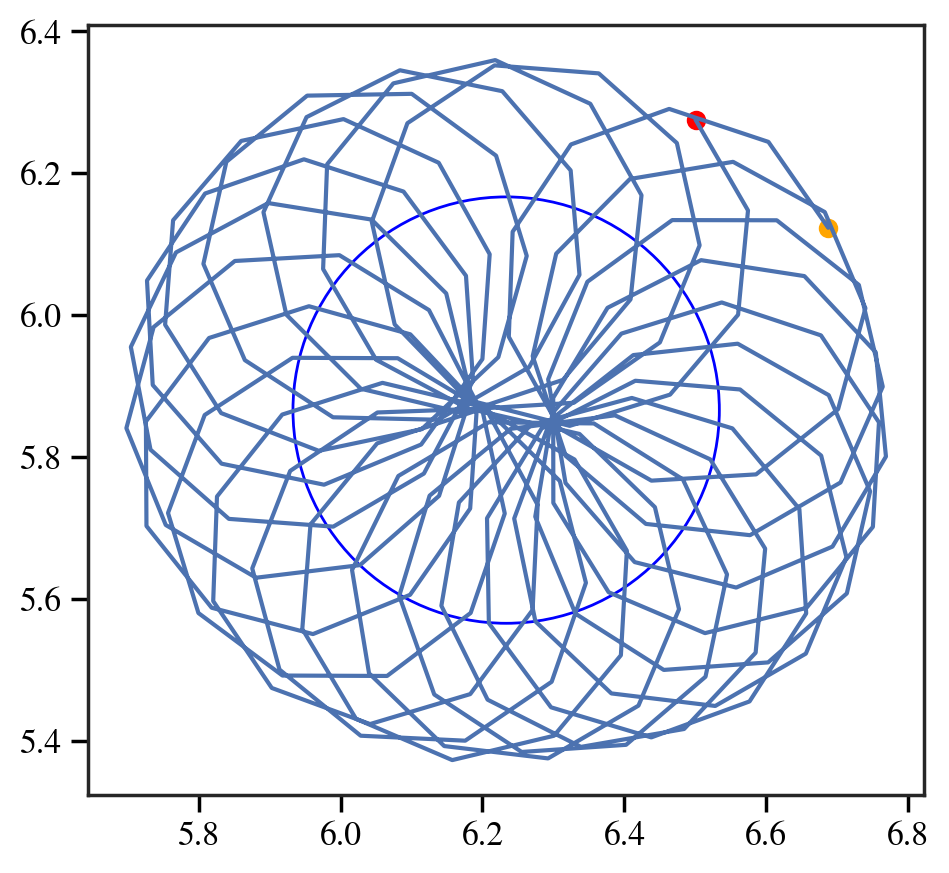

In [35]:
fig, ax = plt.subplots()

tailCounts = 240
plt.plot(sa.totalPositionX[-tailCounts:, 0, 0], sa.totalPositionX[-tailCounts:, 0, 1])
plt.scatter(sa.totalPositionX[-tailCounts, 0, 0], sa.totalPositionX[-tailCounts, 0, 1], color='red')
plt.scatter(sa.totalPositionX[-1, 0, 0], sa.totalPositionX[-1, 0, 1], color='orange')

analysisRadius = model.speedV / np.abs(model.strengthK * np.sin(model.phaseLagA0))
center = np.array([
    sa.totalPositionX[-tailCounts:, 0, 0].max() + sa.totalPositionX[-tailCounts:, 0, 0].min(),
    sa.totalPositionX[-tailCounts:, 0, 1].max() + sa.totalPositionX[-tailCounts:, 0, 1].min()
]) / 2
circle = plt.Circle(center, analysisRadius, color='blue', fill=False)
ax.add_artist(circle)

ax.set_aspect('equal')

In [7]:
totalTvRadius = list()
step = 1

for idx, singleClass in enumerate(classes):
    subPositionX = sa.totalPositionX[::step, singleClass, :]
    classCenter = classCenters[idx]
    tvMaxRadius = sa.calc_replative_distance(subPositionX, classCenter).mean(axis=1)
    totalTvRadius.append(tvMaxRadius)

analysisRadius = model.speedV / np.abs(model.strengthK * np.sin(model.phaseLagA0))
tRanges = (np.arange(0, len(totalTvRadius[0])) * model.shotsnaps * step * model.dt)

C:\Users\Luyan\AppData\Local\Temp\ipykernel_21752\4278019128.py:38: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ax.indicate_inset_zoom(axTide, linewidth=1, color="black")


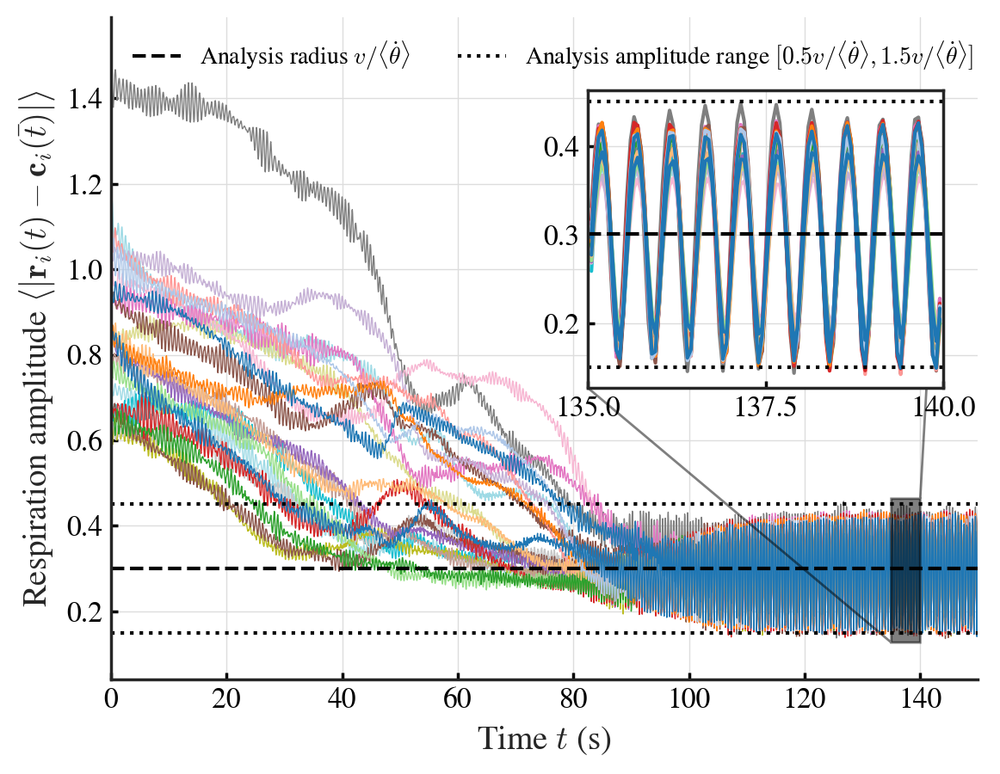

In [13]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

fig, ax = plt.subplots(figsize=(6.5, 5))

colors = plt.cm.tab20(np.linspace(1, 0, len(totalTvRadius)))
for i, tvRadius in enumerate(totalTvRadius[:]):
    plt.plot(tRanges, tvRadius, alpha=1, lw=0.5, color=colors[i])

ax.axhline(analysisRadius, color="black", lw=1.5, ls="--", label=r"Analysis radius $v/\langle\dot{\theta}\rangle$")
ax.axhline(analysisRadius * 0.5, color="black", lw=1.5, ls=":")
ax.axhline(analysisRadius * 1.5, color="black", lw=1.5, ls=":", 
            label=r"Analysis amplitude range $[0.5v/\langle\dot{\theta}\rangle, 1.5v/\langle\dot{\theta}\rangle]$")
# plt.axvline(2360 * model.shotsnaps * model.dt)
# plt.axvline(2550 * model.shotsnaps * model.dt)
# plt.xlim(0, len(totalTvRadius[0]) - 1)
ax.tick_params(length=3, direction="in")
ax.set_xlabel("Time $t$ (s)", fontsize=14)
ax.set_ylabel(r"Respiration amplitude $\left< \left| \mathbf{r}_i(t)-\mathbf{c}_i(\bar{t}) \right| \right> $", fontsize=14)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.grid()
ax.set_xlim(0, 150)
ax.set_ylim(None, 1.59)
ax.legend(ncols=2, fontsize=10, loc="upper left", frameon=False)

# axTide = inset_axes(ax, width="20%", height="42%", loc='lower left')
axTide = ax.inset_axes([0.55, 0.44, 0.41, 0.45])

selectWindow = (tRanges > 135) & (tRanges < 140)

for i, tvRadius in enumerate(totalTvRadius[:]):
    axTide.plot(tRanges[selectWindow], tvRadius[selectWindow], alpha=1, lw=1.5, color=colors[i], ls="-")

axTide.axhline(analysisRadius, color="black", lw=1.5, ls="--")
axTide.axhline(analysisRadius * 0.5, color="black", lw=1.5, ls=":")
axTide.axhline(analysisRadius * 1.5, color="black", lw=1.5, ls=":")

ax.indicate_inset_zoom(axTide, linewidth=1, color="black")
axTide.tick_params(length=3, direction="in")
axTide.grid()
axTide.set_xlim(135, 140)
axTide.set_xticks([135, 137.5, 140])

plt.savefig("figs/respiration_amplitude_inset.pdf", bbox_inches="tight")

In [81]:
analysisRadius / 2 + analysisRadius

0.4506266675306859

In [76]:
1.48 / 2

0.74

In [ ]:
np.linspace(model.omegaMin - model.deltaOmega, model.omegaMin + model.deltaOmega, 1000)

In [70]:
freqs = np.linspace(model.omegaMin - model.deltaOmega, model.omegaMin + model.deltaOmega, 1000)
radius = model.speedV / np.abs(freqs + model.strengthK * np.sin(model.phaseLagA0))

In [74]:
radius.max(), radius.min()

(0.3338491888984904, 0.27307250038839215)

In [72]:
freqs + model.strengthK * np.sin(model.phaseLagA0)

array([ 8.98609342,  8.98809542,  8.99009743,  8.99209943,  8.99410143,
        8.99610343,  8.99810543,  9.00010744,  9.00210944,  9.00411144,
        9.00611344,  9.00811544,  9.01011745,  9.01211945,  9.01412145,
        9.01612345,  9.01812545,  9.02012746,  9.02212946,  9.02413146,
        9.02613346,  9.02813546,  9.03013747,  9.03213947,  9.03414147,
        9.03614347,  9.03814547,  9.04014748,  9.04214948,  9.04415148,
        9.04615348,  9.04815548,  9.05015749,  9.05215949,  9.05416149,
        9.05616349,  9.05816549,  9.0601675 ,  9.0621695 ,  9.0641715 ,
        9.0661735 ,  9.0681755 ,  9.07017751,  9.07217951,  9.07418151,
        9.07618351,  9.07818551,  9.08018752,  9.08218952,  9.08419152,
        9.08619352,  9.08819552,  9.09019753,  9.09219953,  9.09420153,
        9.09620353,  9.09820553,  9.10020754,  9.10220954,  9.10421154,
        9.10621354,  9.10821554,  9.11021755,  9.11221955,  9.11422155,
        9.11622355,  9.11822555,  9.12022756,  9.12222956,  9.12

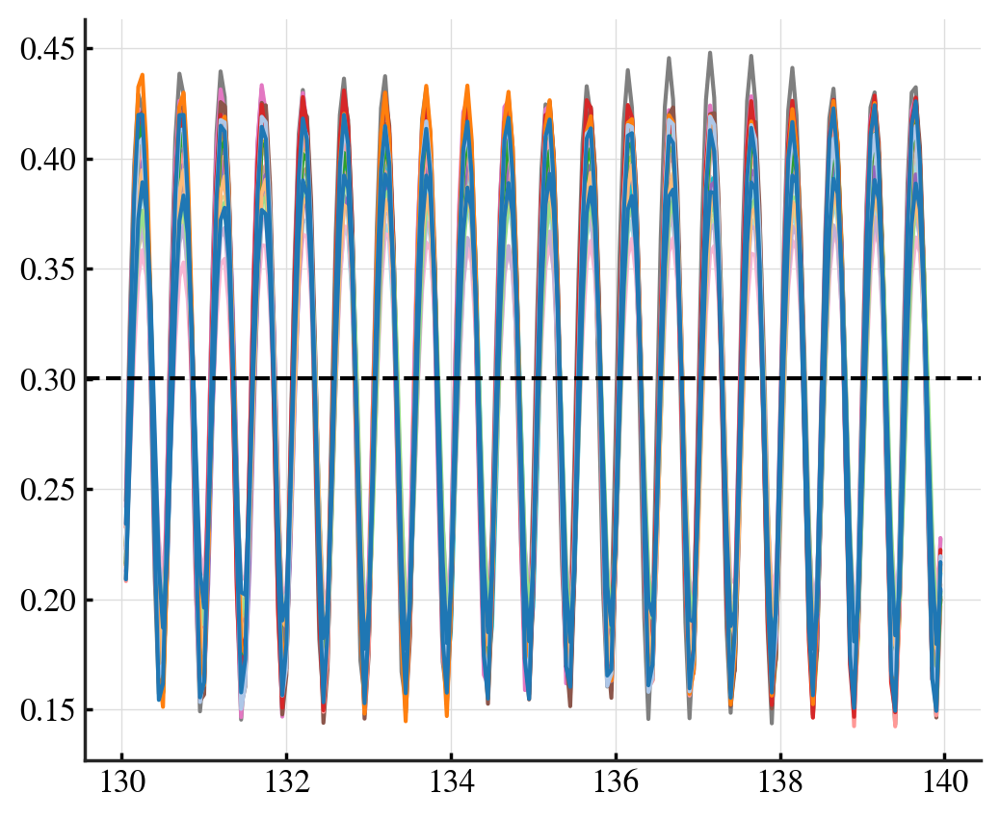

In [32]:
selectWindow = (tRanges > 130) & (tRanges < 140)

colors = plt.cm.tab20(np.linspace(1, 0, len(totalTvRadius)))
for i, tvRadius in enumerate(totalTvRadius[:]):
    plt.plot(tRanges[selectWindow], tvRadius[selectWindow], alpha=1, lw=1.5, color=colors[i])

plt.axhline(analysisRadius, color="black", lw=1.5, ls="--", label=r"Analysis radius $v/\dot{\theta}_i$")
plt.tick_params(length=3, direction="in")
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.grid()
# plt.xlim(120, 140)

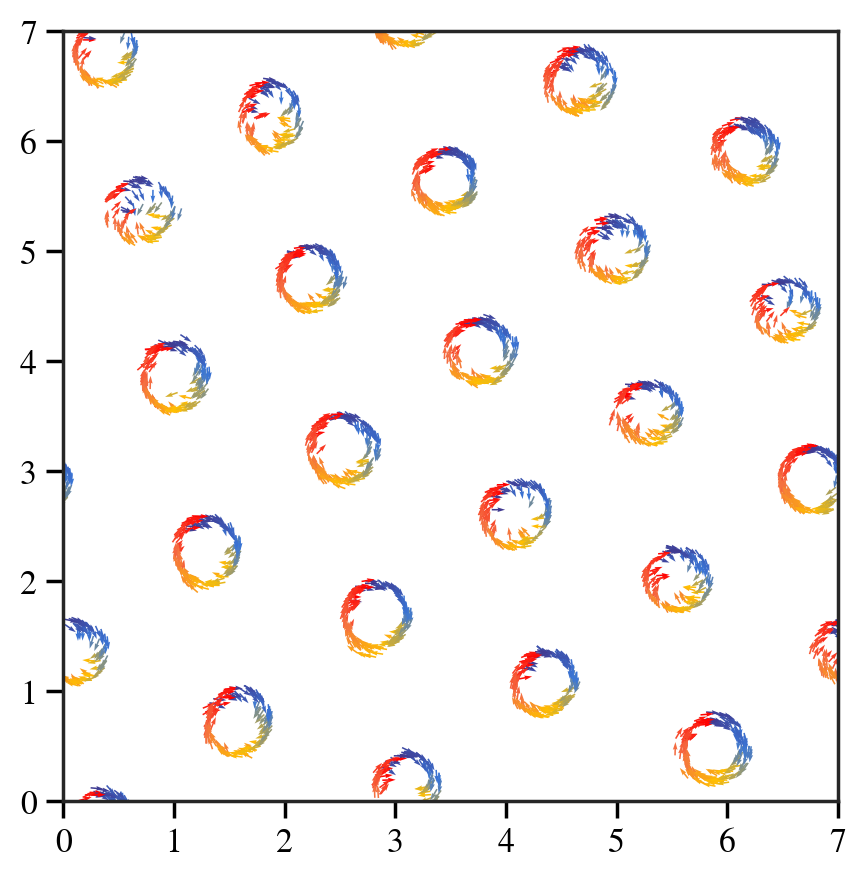

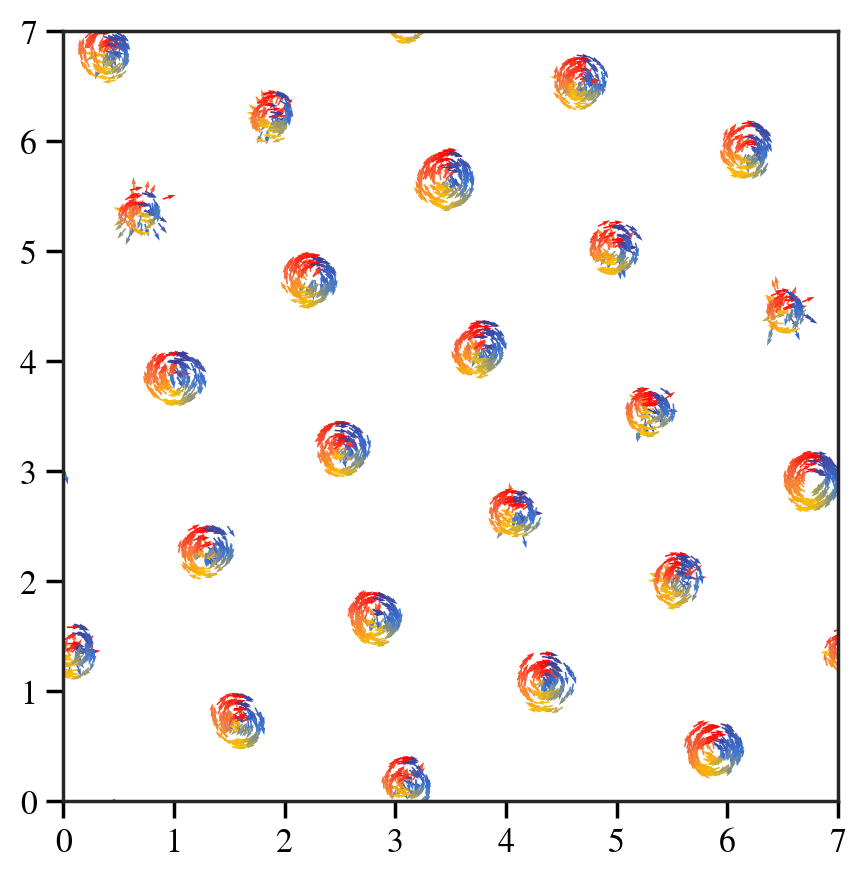

In [102]:
sa.plot_spatial(index=2360)
sa.plot_spatial(index=2550)

# Single cell trajectory

In [4]:
reduceModel = PhaseLagPatternFormation(
    strengthK=20, distanceD0=1, phaseLagA0=0.6 * np.pi,
    # initPhaseTheta=np.zeros(1000), 
    omegaMin=0, deltaOmega=0,
    agentsNum=102, dt=0.001,
    tqdm=True, savePath=SAVE_PATH, shotsnaps=1, 
    randomSeed=9, overWrite=False
)
sa = StateAnalysis(reduceModel)

(4.0, 6.0)

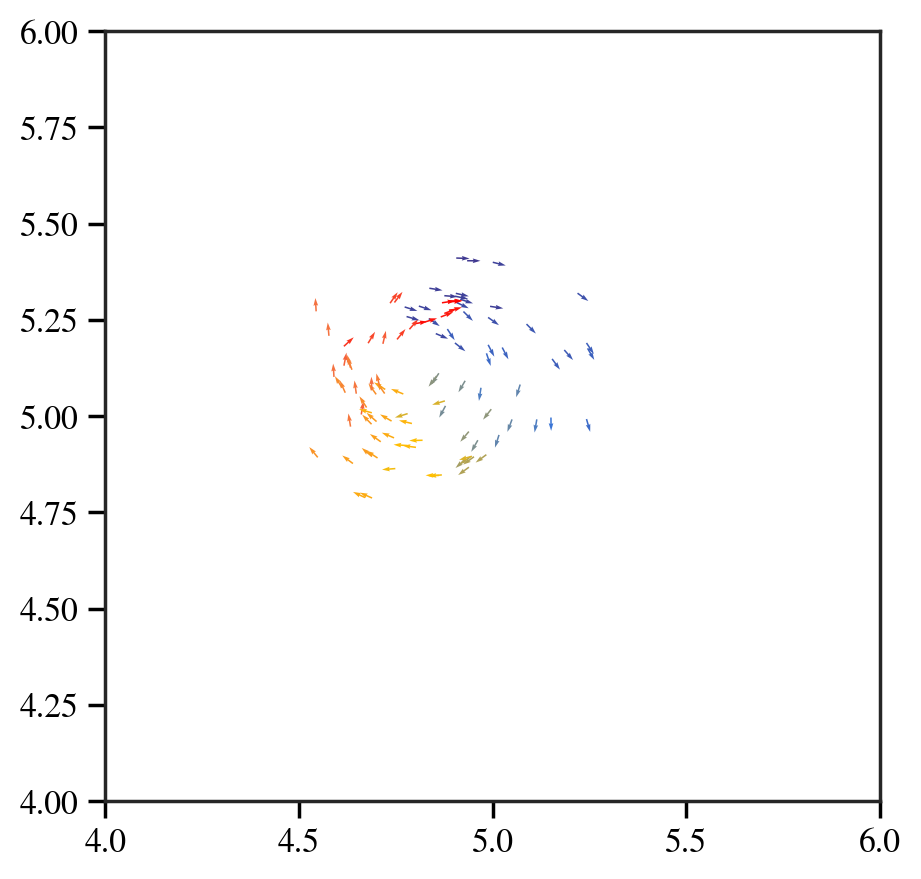

In [13]:
sa.plot_spatial(colorsBy="phase")
plt.xlim(4, 6)
plt.ylim(4, 6)

In [18]:
sa.totalPositionX.shape

(10000, 102, 2)

(4.0, 6.0)

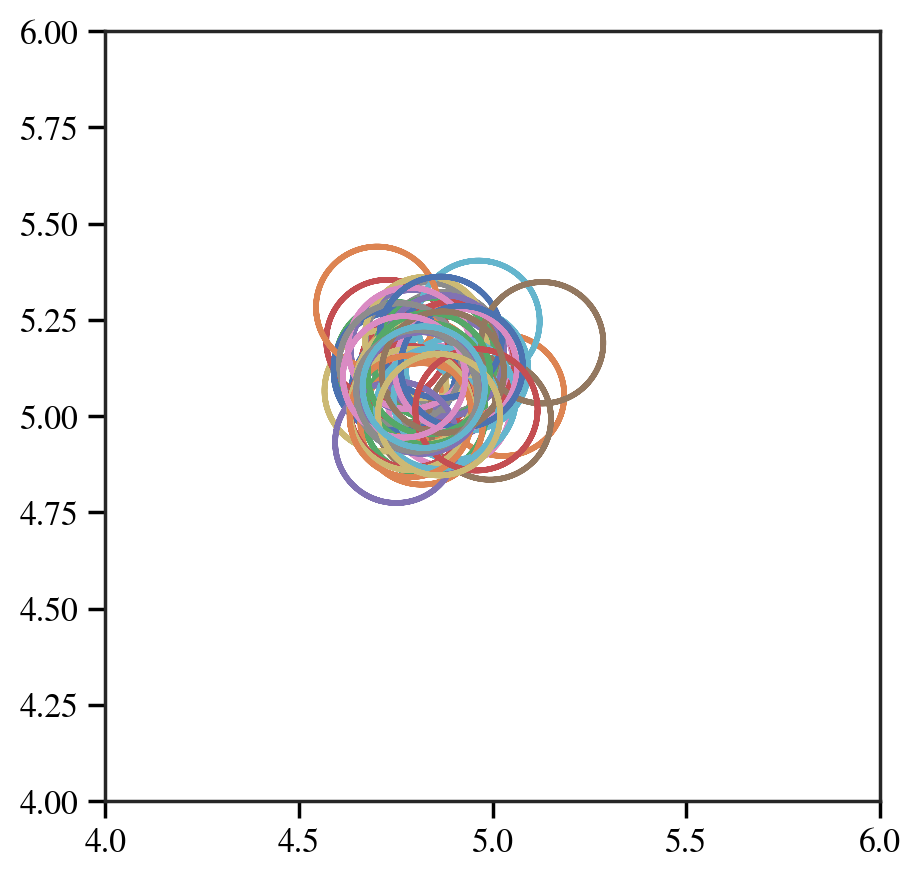

In [22]:
fig, ax = plt.subplots(figsize=(5, 5))

timeCounts = 1000
# trajectoryColors = ["#3A76D6", "#F46F43", "#FF0000", "#403990", "#FFC001"]
# for i, singleSelectIdx in enumerate([0, 5, 13, 75, 80]):
for i, singleSelectIdx in enumerate(range(50)):
    ax.plot(
        sa.totalPositionX[-timeCounts:, singleSelectIdx, 0],
        sa.totalPositionX[-timeCounts:, singleSelectIdx, 1],
        # color=trajectoryColors[i], 
        alpha=1, lw=2, zorder=0
    )

plt.xlim(4, 6)
plt.ylim(4, 6)

# Multi cells breathe sync

In [4]:
model = PhaseLagPatternFormation(
    strengthK=20, distanceD0=1, phaseLagA0=0.6 * np.pi,
    # initPhaseTheta=np.zeros(1000), 
    omegaMin=0, deltaOmega=0,
    agentsNum=3000, dt=0.005,
    tqdm=True, savePath=SAVE_PATH, shotsnaps=1, 
    randomSeed=10, overWrite=False
)
sa = StateAnalysis(model)

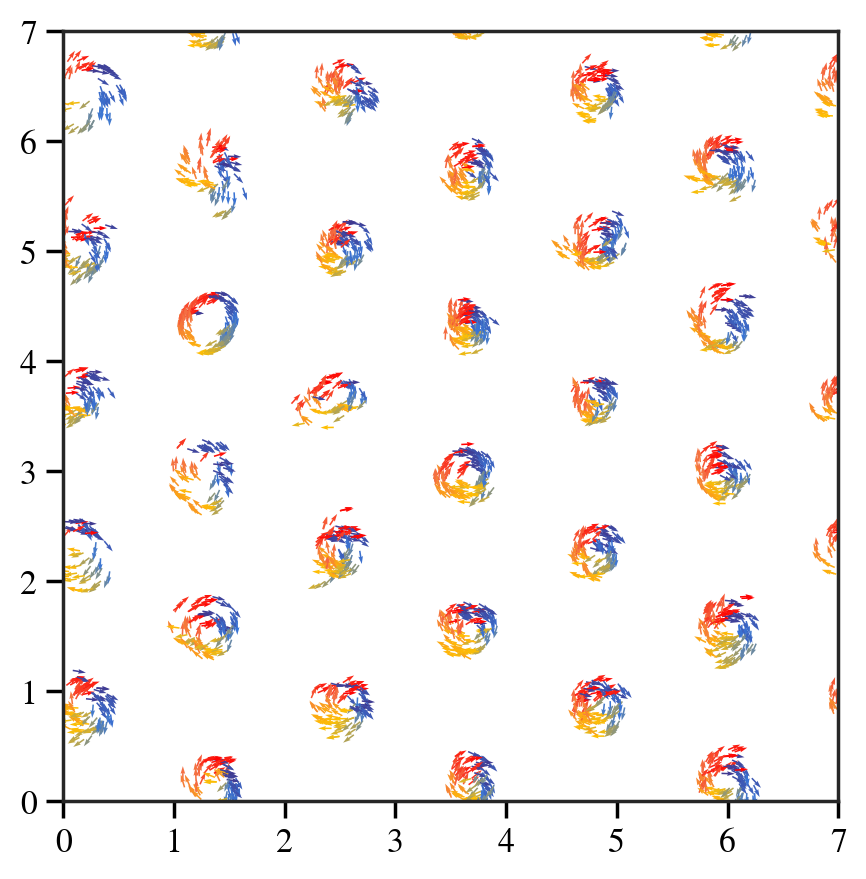

In [6]:
sa.plot_spatial(colorsBy="phase")

In [7]:
shift = np.array([0., 0.])

classes, centers = sa.calc_classes_and_centers(classDistance=0.5, lookIdx=-1)
centers = np.mod(centers + shift, model.boundaryLength)

classCenters: List[np.ndarray] = []
for c in classes:
    singleClassCenters = centers[c]

    maxDeltaX = np.abs(singleClassCenters[:, 0] - singleClassCenters[:, 0, np.newaxis]).max()
    subXShift = model.halfBoundaryLength if maxDeltaX > model.halfBoundaryLength else 0
    maxDeltaY = np.abs(singleClassCenters[:, 1] - singleClassCenters[:, 1, np.newaxis]).max()
    subYShift = model.halfBoundaryLength if maxDeltaY > model.halfBoundaryLength else 0

    singleClassCenters = np.mod(singleClassCenters - np.array([subXShift, subYShift]), model.boundaryLength)
    classCenter = np.mod(singleClassCenters.mean(axis=0) + np.array([subXShift, subYShift]), model.boundaryLength)
    classCenters.append(classCenter)
classCenters: np.ndarray = np.array(classCenters)

edgeLenThres = (
    model.distanceD0 + 
    2 * model.speedV / np.abs(model.freqOmega - model.strengthK * np.sin(model.phaseLagA0)).min()
) * 1.2
edges, ajdClassCenters = sa.calc_nearby_edges(classCenters=classCenters, stdMulti=0.3)

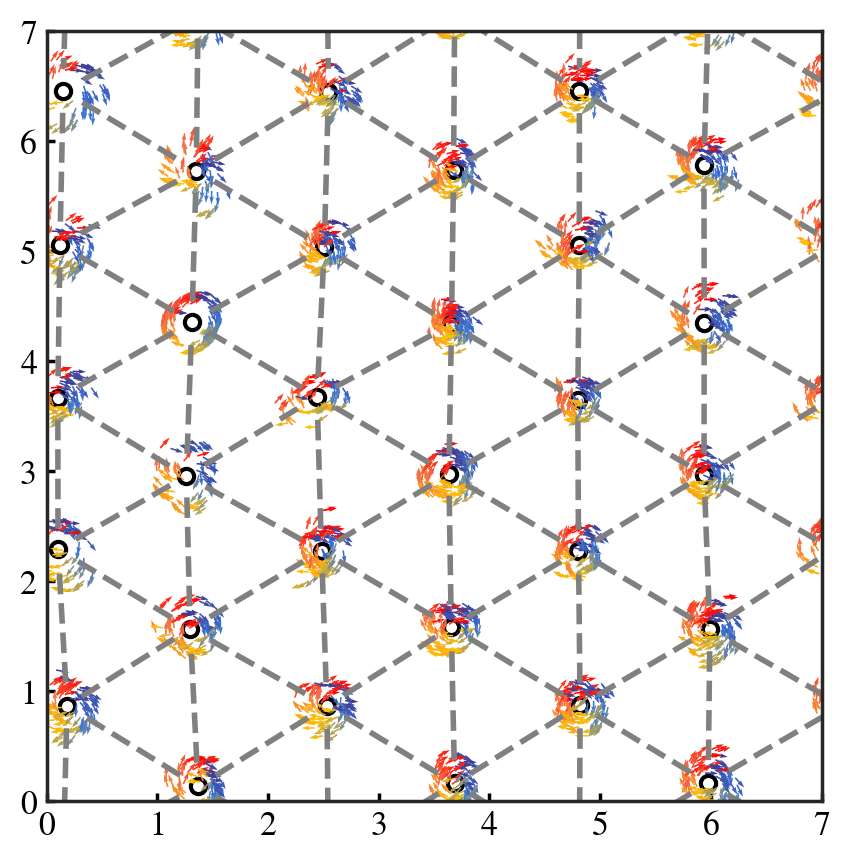

In [9]:
fig, ax = plt.subplots(figsize=(5, 5))

plt.scatter(
    classCenters[:, 0], classCenters[:, 1],
    facecolor="white", s=30, edgecolor="black", lw=1.5
)

for edge in edges[:]:
    # plt.plot(ajdClassCenters[edge, 0], ajdClassCenters[edge, 1],
    #          color="black", lw=1.2, alpha=0.3, linestyle=(0, (10, 2)), zorder=0)
    edgeCenter = (ajdClassCenters[edge[0]] + ajdClassCenters[edge[1]]) / 2
    edgeNodesDelta = ajdClassCenters[edge[0]] - ajdClassCenters[edge[1]]
    edgeAngle = np.arctan2(edgeNodesDelta[1], edgeNodesDelta[0])
    edgeShift = np.array([np.cos(edgeAngle), np.sin(edgeAngle)]) * 0.5 * model.distanceD0

    plt.plot([edgeCenter[0] - edgeShift[0], edgeCenter[0] + edgeShift[0]], 
             [edgeCenter[1] - edgeShift[1], edgeCenter[1] + edgeShift[1]],
             lw=2, alpha=1, color="gray", ls="--")

analRadius = model.distanceD0 + 2 * model.speedV / np.abs(model.strengthK * np.sin(model.phaseLagA0))

for classCenter in classCenters:
    circle = plt.Circle(
        classCenter, analRadius, color="black", fill=False, lw=2, alpha=1, ls="--"
    )
    # ax.add_artist(circle)

sa.plot_spatial(ax=ax, colorsBy="phase", index=-1, shift=shift)

plt.tick_params(length=3, direction="in")

In [2]:
cellModel = CellAndSingleParticle(
    strengthK=20, distanceD0=1, phaseLagA0=0.6 * np.pi,
    omegaMin=0, deltaOmega=0,
    agentsNum=100, dt=0.001,
    singleParticleDis=0.2, singleParticlePhase=0,
    tqdm=True, savePath=SAVE_PATH, shotsnaps=5, 
    randomSeed=randomSeed, overWrite=False
)
cellModel.run(1000)
sa = StateAnalysis(cellModel)

F:\MS_ExperimentData\general/CellAndSingleParticle(strengthK=20.000,distanceD0=1.000,phaseLagA0=1.885,sPD=0.200,sPP=0.000,boundaryLength=7.0,speedV=3.0,omegaMin=0.000,deltaOmega=0.000,agentsNum=100,dt=0.001,shotsnaps=5,randomSeed=10).h5 already exists, but has only 201 snapshots, will continue to run until 202 snapshots.


  0%|          | 0/4 [00:00<?, ?it/s]

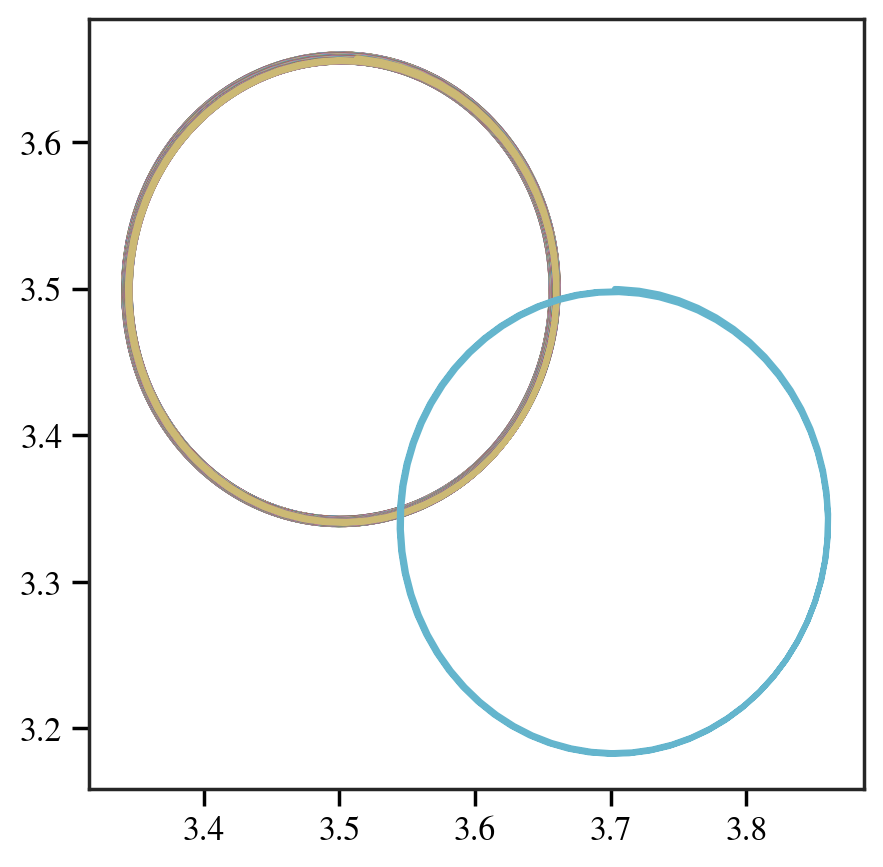

In [3]:
fig, ax = plt.subplots(figsize=(5, 5))

timeCounts = 1000
# trajectoryColors = ["#3A76D6", "#F46F43", "#FF0000", "#403990", "#FFC001"]
# for i, singleSelectIdx in enumerate([0, 5, 13, 75, 80]):
for i, singleSelectIdx in enumerate(range(cellModel.agentsNum)):
    ax.plot(
        sa.totalPositionX[-timeCounts:, singleSelectIdx, 0],
        sa.totalPositionX[-timeCounts:, singleSelectIdx, 1],
        # color=trajectoryColors[i], 
        alpha=1, lw=2, zorder=0
    )

# plt.xlim(4, 6)
# plt.ylim(4, 6)

In [49]:
strengthK = 20
distanceD0 = 1
phaseLagA0 = 0.6 * np.pi
speedV = 3
singleParticleDiss = np.linspace(0.1, distanceD0 + speedV / np.abs(strengthK * np.sin(phaseLagA0)), 21)
singleParticleAngles = np.linspace(-np.pi, np.pi, 20, endpoint=False)

models = [
    CellAndSingleParticle(
        strengthK=strengthK, distanceD0=distanceD0, phaseLagA0=phaseLagA0,
        singleParticleDis=singleParticleDis, singleParticleAngle=singleParticleAngle,
        agentsNum=100, dt=0.001,
        tqdm=False, savePath=SAVE_PATH, shotsnaps=5, 
        randomSeed=randomSeed, overWrite=False
    )
    for singleParticleDis in singleParticleDiss
    for singleParticleAngle in singleParticleAngles
]

(2.0, 5.0)

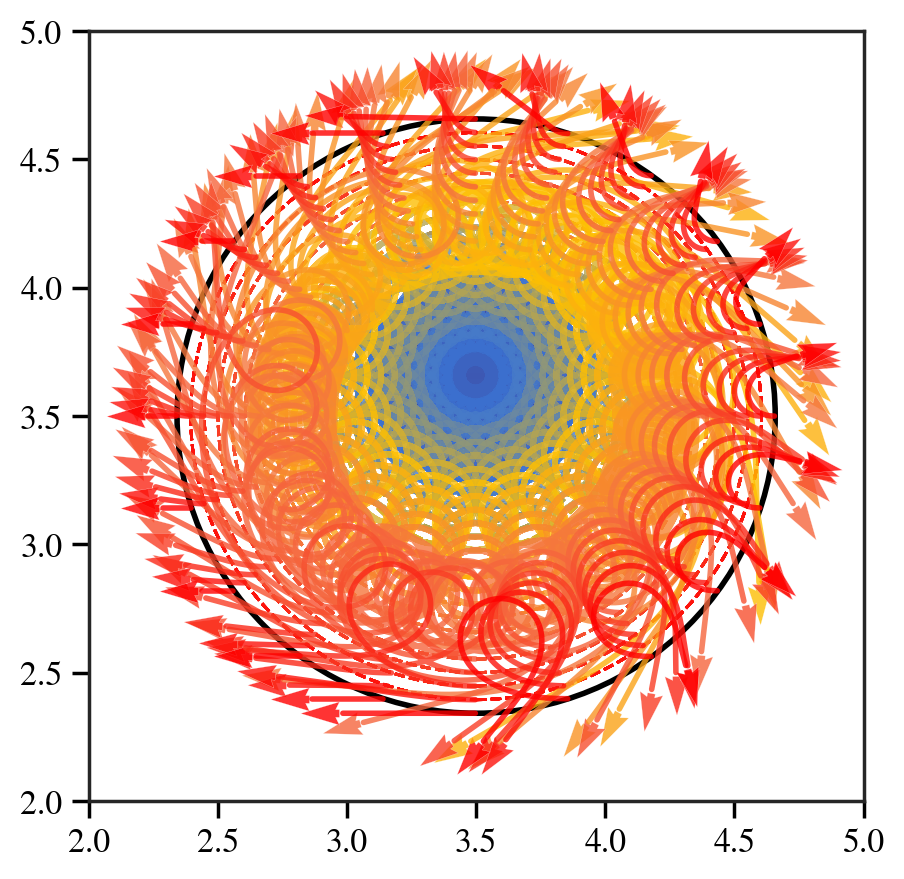

In [50]:
fig, ax = plt.subplots(figsize=(5, 5))
# model.plot(ax=ax, colorsBy="phase")
boxCenter = np.array([3.5, 3.5])
analRadius = speedV / np.abs(strengthK * np.sin(phaseLagA0))
disThres = (distanceD0 + analRadius) * 1.1
totalBreakThres = list()

for model in models[:]:

    sa = StateAnalysis(model)    
    sinParPos = sa.totalPositionX[:, -1]
    sinParPha = sa.totalPhaseTheta[:, -1]

    alpha = 0.8
    # alpha = 1 - (model.singleParticleDis / singleParticleDiss.max()) * 0.5
    # color = "C2"
    color = cmap(model.singleParticleDis / singleParticleDiss.max())

    circle = plt.Circle(boxCenter, model.singleParticleDis, color=color, 
                    fill=False, lw=1, alpha=1, ls="--")
    ax.add_artist(circle)

    centerDis = sa.calc_replative_distance(sinParPos, boxCenter)
    breakThres = np.where(centerDis > disThres)[0]
    if len(breakThres) == 0:
        plt.plot(sinParPos[:, 0], sinParPos[:, 1], color=color, lw=2, alpha=alpha)
        continue

    firstBreakThres = breakThres[0]
    totalBreakThres.append(firstBreakThres)
    plt.plot(sinParPos[:firstBreakThres, 0], sinParPos[:firstBreakThres, 1], color=color, lw=2, alpha=alpha)
    plt.quiver(
        sinParPos[firstBreakThres, 0], sinParPos[firstBreakThres, 1],
        np.cos(sinParPha[firstBreakThres]), np.sin(sinParPha[firstBreakThres]),
        color=color, lw=0.1, alpha=alpha, width=0.02, scale=20
    )
    

# plt.quiver(model.positionX[:-1, 0], model.positionX[:-1, 1],
#            np.cos(model.phaseTheta[:-1]), np.sin(model.phaseTheta[:-1]),)
circle = plt.Circle(boxCenter, analRadius, color="purple", 
                    fill=False, lw=2, alpha=1, ls="-")
ax.add_artist(circle)
circle = plt.Circle(boxCenter, model.distanceD0 + analRadius, color="black", 
                    fill=False, lw=2, alpha=1, ls="-")
ax.add_artist(circle)
plt.ylim(2, 5)
plt.xlim(2, 5)
# plt.xlim(0, sa.totalPositionX.shape[0])

  0%|          | 0/420 [00:00<?, ?it/s]

(2.0, 5.0)

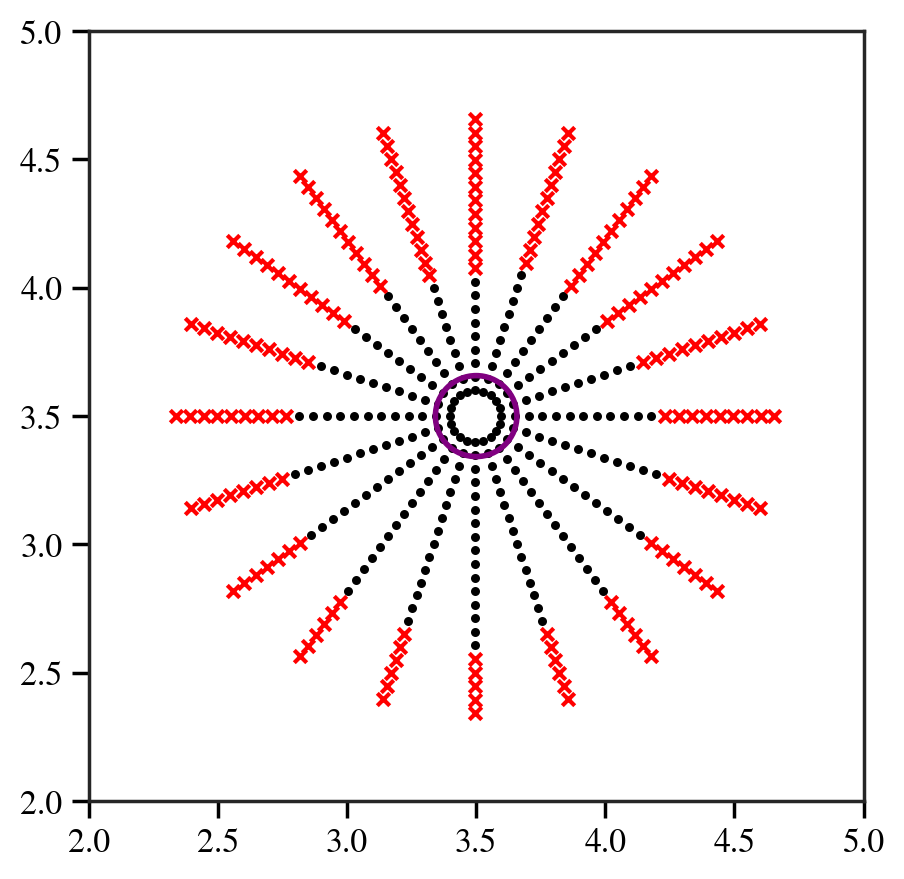

In [68]:
fig, ax = plt.subplots(figsize=(5, 5))
# model.plot(ax=ax, colorsBy="phase")
boxCenter = np.array([3.5, 3.5])
analRadius = speedV / np.abs(strengthK * np.sin(phaseLagA0))
disThres = (distanceD0 + analRadius) * 1.1
catchMap = pd.DataFrame(index=singleParticleDiss, columns=singleParticleAngles)

for model in tqdm(models):

    sa = StateAnalysis(model)    
    sinParPos = sa.totalPositionX[:, -1]
    sinParPha = sa.totalPhaseTheta[:, -1]

    alpha = 0.8
    # alpha = 1 - (model.singleParticleDis / singleParticleDiss.max()) * 0.5
    # color = "C2"
    color = cmap(model.singleParticleDis / singleParticleDiss.max())

    centerDis = sa.calc_replative_distance(sinParPos, boxCenter)
    breakThres = np.where(centerDis > disThres)[0]
    if len(breakThres) == 0:
        plt.scatter(sinParPos[0, 0], sinParPos[0, 1], 
                    color='black', s=5, marker="o")
        # plt.plot(sinParPos[:, 0], sinParPos[:, 1], color=color, lw=2, alpha=alpha)
        catchMap.loc[model.singleParticleDis, model.singleParticleAngle] = 0
        continue

    firstBreakThres = breakThres[0]
    plt.scatter(sinParPos[0, 0], sinParPos[0, 1], color="#FF0000", s=20, marker="x")
    catchMap.loc[model.singleParticleDis, model.singleParticleAngle] = 1
    
circle = plt.Circle(boxCenter, analRadius, color="purple", 
                    fill=False, lw=2, alpha=1, ls="-")
ax.add_artist(circle)
plt.ylim(2, 5)
plt.xlim(2, 5)
# plt.xlim(0, sa.totalPositionX.shape[0])

In [75]:
236 * 3 / 478

1.4811715481171548

In [78]:
escapeDiss = catchMap.apply(lambda x: x[x.diff() == 1].index).values[0]
escapeDiss

array([0.7346316 , 0.78751757, 0.84040353, 0.8932895 , 0.8932895 ,
       0.94617547, 0.8932895 , 0.8932895 , 0.84040353, 0.78751757,
       0.7346316 , 0.68174563, 0.62885967, 0.62885967, 0.62885967,
       0.5759737 , 0.5759737 , 0.62885967, 0.62885967, 0.68174563])

In [52]:
model = PhaseLagPatternFormation(
    strengthK=20, distanceD0=1, phaseLagA0=0.6 * np.pi,
    # initPhaseTheta=np.zeros(1000), 
    omegaMin=0, deltaOmega=0,
    agentsNum=3000, dt=0.005,
    tqdm=True, savePath=SAVE_PATH, shotsnaps=1, 
    randomSeed=10, overWrite=False
)
sa = StateAnalysis(model)

In [53]:
def calc_lattice_constants(sa: StateAnalysis, plot: bool = False, lookIdx: int = -1):

    sa: StateAnalysis
    model = sa.model
    shift = np.array([0., 0.])
    analysisRadius = model.speedV / np.abs(model.strengthK * np.sin(model.phaseLagA0))

    classes, centers = sa.calc_classes_and_centers(classDistance=analysisRadius, lookIdx=lookIdx)
    if len(classes) > model.agentsNum * 0.2:
        # print(f"Too many classes: {len(classes)} > {model.agentsNum * 0.2}, skipping.")
        return [], []
    numInClasses = np.array([len(c) for c in classes])
    # zScoreNum = stats.zscore(numInClasses)
    # classes = [classes[c] for c in range(len(classes)) 
    #            if (zScoreNum[c] > -0.4) and (numInClasses[c] > 10)]
    numThres = np.median(numInClasses[numInClasses > 10]) * 0.
    classes = [classes[c] for c in range(len(classes))
               if (numInClasses[c] > max(numThres, 10))]
    centers = np.mod(centers + shift, model.boundaryLength)
    if len(classes) <= 1:
        # print("Not enough classes, skipping.")
        return [], []

    classCenters: List[np.ndarray] = []
    for c in classes:
        singleClassCenters = centers[c]

        maxDeltaX = np.abs(singleClassCenters[:, 0] - singleClassCenters[:, 0, np.newaxis]).max()
        subXShift = model.halfBoundaryLength if maxDeltaX > model.halfBoundaryLength else 0
        maxDeltaY = np.abs(singleClassCenters[:, 1] - singleClassCenters[:, 1, np.newaxis]).max()
        subYShift = model.halfBoundaryLength if maxDeltaY > model.halfBoundaryLength else 0

        singleClassCenters = np.mod(singleClassCenters - np.array([subXShift, subYShift]), model.boundaryLength)
        classCenter = np.mod(singleClassCenters.mean(axis=0) + np.array([subXShift, subYShift]), model.boundaryLength)
        classCenters.append(classCenter)
    classCenters: np.ndarray = np.array(classCenters)

    edges, ajdClassCenters = sa.calc_nearby_edges(
        classCenters=classCenters, 
        stdMulti=0.3,
        relativeDistance=False
    )

    classAnalRadius = list()

    for _, oscIdx in enumerate(classes):
        freqOmega: np.ndarray = sa.model.freqOmega[oscIdx]
        meanFreq = freqOmega.mean()
        analRadius = model.speedV / np.abs(meanFreq - model.strengthK * np.sin(model.phaseLagA0))
        
        classAnalRadius.append(analRadius)

    classAnalRadius = np.array(classAnalRadius)
    edgeDistances = np.array([
        sa.calc_replative_distance(ajdClassCenters[edge[0]], ajdClassCenters[edge[1]]) 
        for edge in edges
    ])

    if plot:
        sa.plot_spatial(colorsBy="phase", index=-1, shift=shift)
        plt.scatter(
            classCenters[:, 0], classCenters[:, 1],
            facecolor="white", s=30, edgecolor="black", lw=1.5
        )
        for edge in edges:
            plt.plot(ajdClassCenters[edge, 0], ajdClassCenters[edge, 1],
                    color="black", lw=1.2, alpha=0.3, linestyle=(0, (10, 2)), zorder=0)

    # print(len(classes))

    return classAnalRadius, edgeDistances

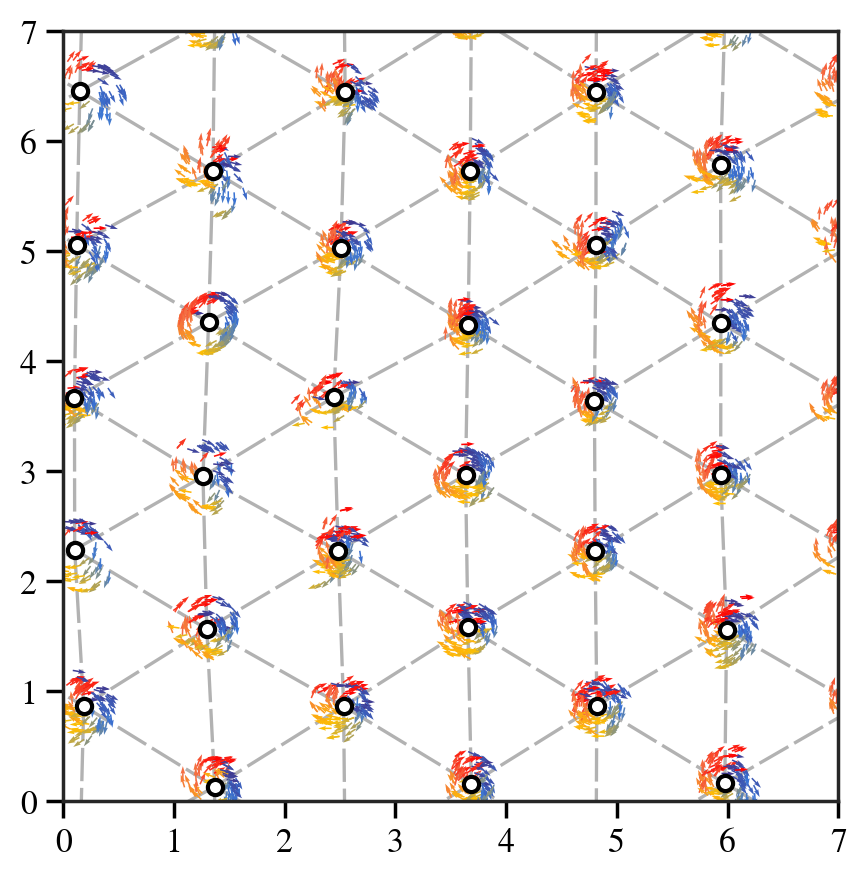

In [54]:
classAnalRadius, edgeDistances = calc_lattice_constants(sa, plot=True, lookIdx=-1)

In [3]:
phaseLags = [0.6 * np.pi]
omegaMins = [0]
randomSeeds = [10]
strengthKs = [11]
distanceD0s = [1]
deltaOmegas = np.linspace(0, 1, 11)

models = [
    PhaseLagPatternFormation(
        strengthK=strengthK, distanceD0=distanceD0, phaseLagA0=phaseLag,
        freqDist="uniform", initPhaseTheta=None,
        omegaMin=omegaMin, deltaOmega=deltaOmega, 
        agentsNum=2000, dt=0.005,
        tqdm=True, savePath=SAVE_PATH, shotsnaps=10, 
        randomSeed=randomSeed, overWrite=False
    )
    for strengthK in strengthKs
    for distanceD0 in distanceD0s
    for omegaMin in omegaMins
    for deltaOmega in deltaOmegas
    for phaseLag in phaseLags
    for randomSeed in randomSeeds
]

sas = [StateAnalysis(model) for model in tqdm(models)]

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

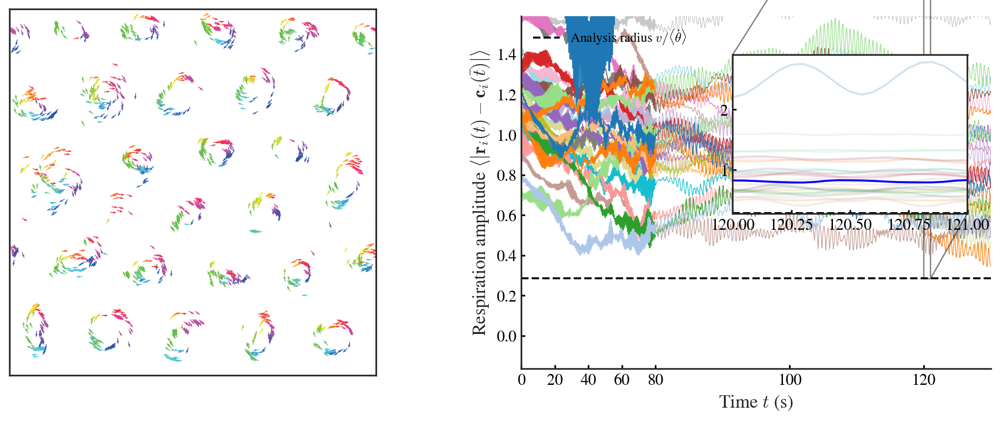

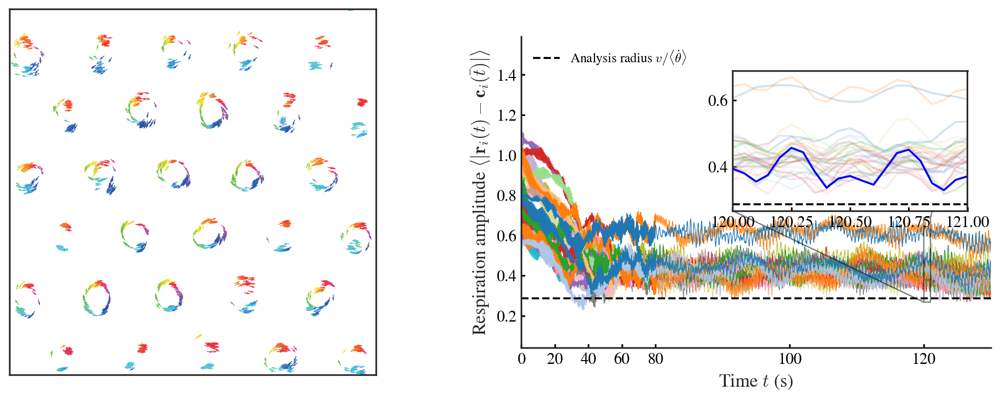

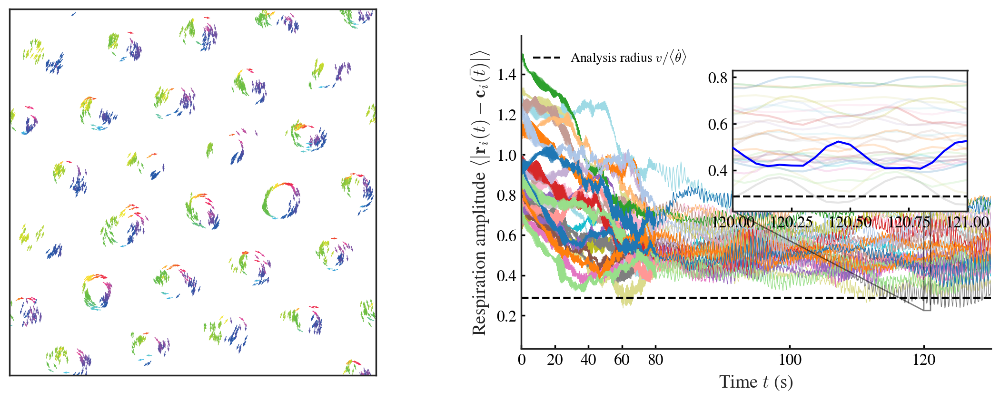

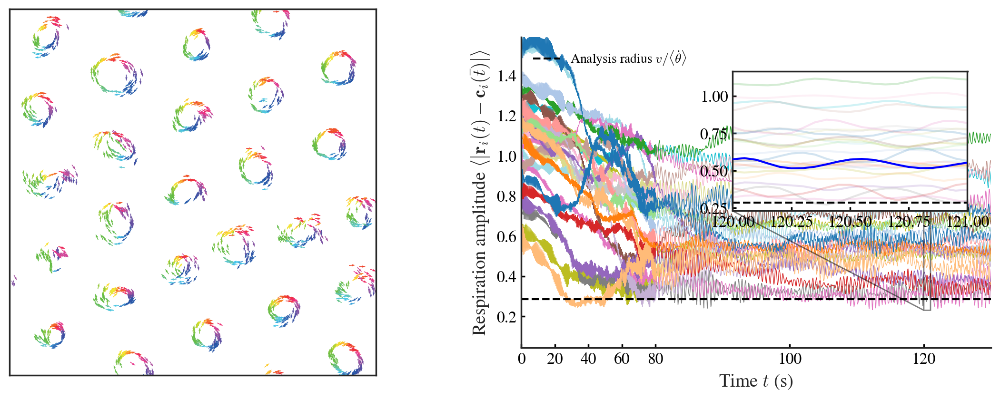

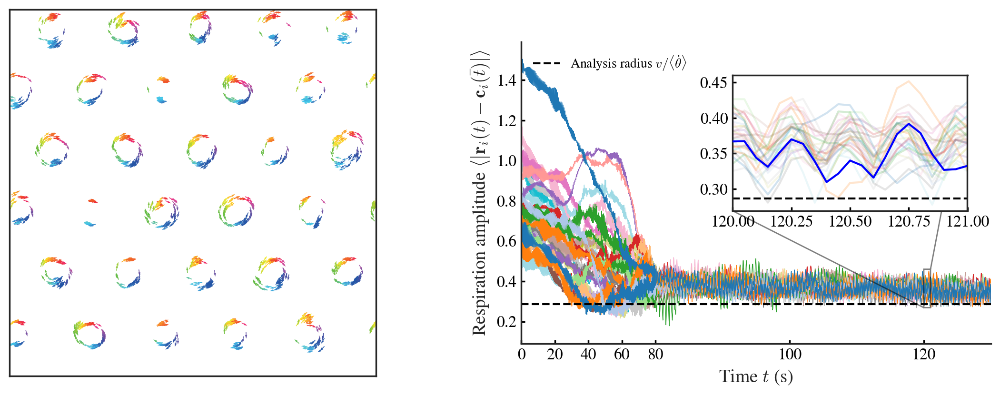

...

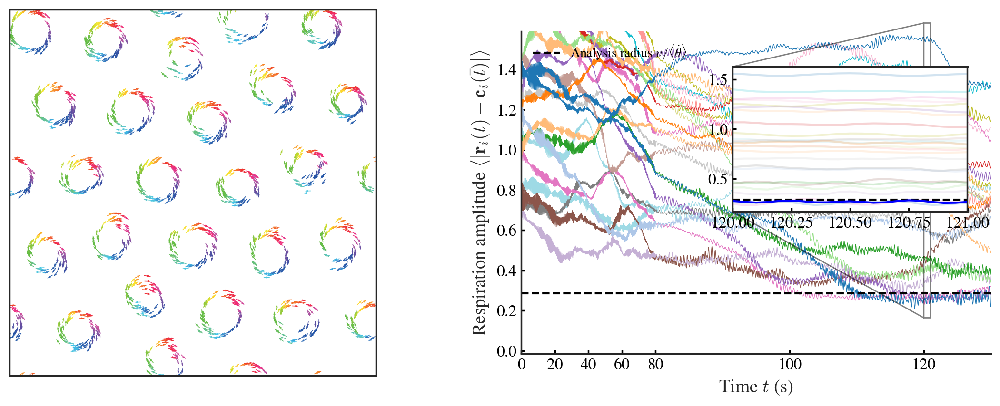

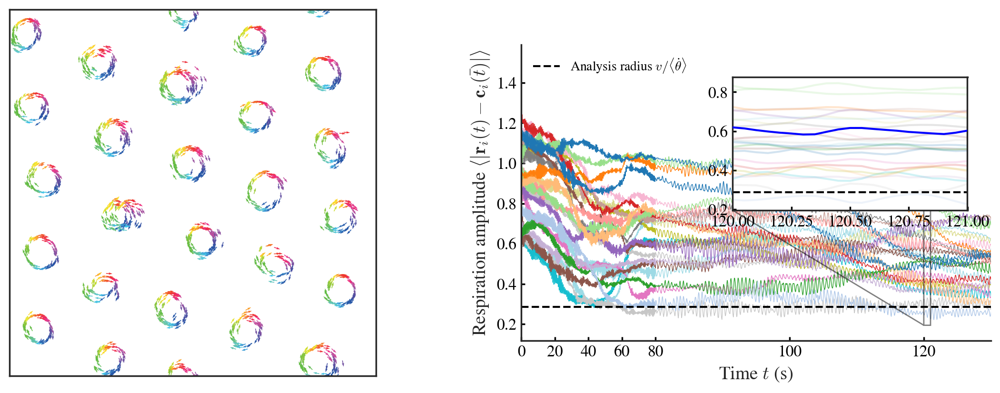

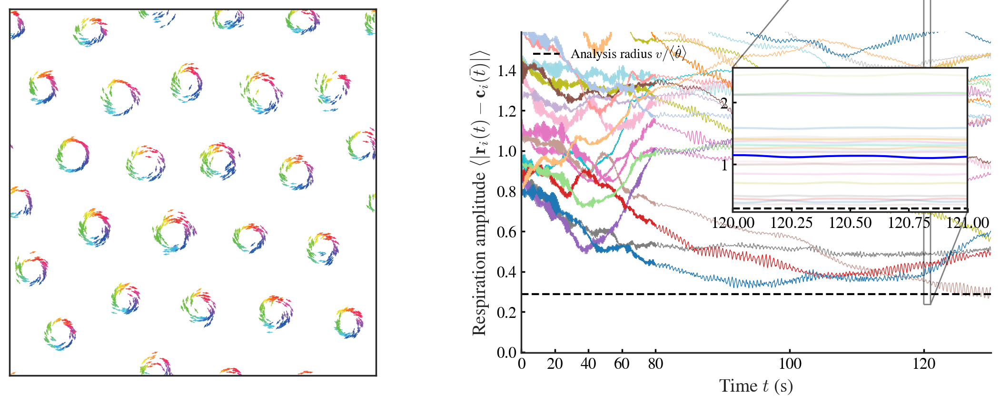

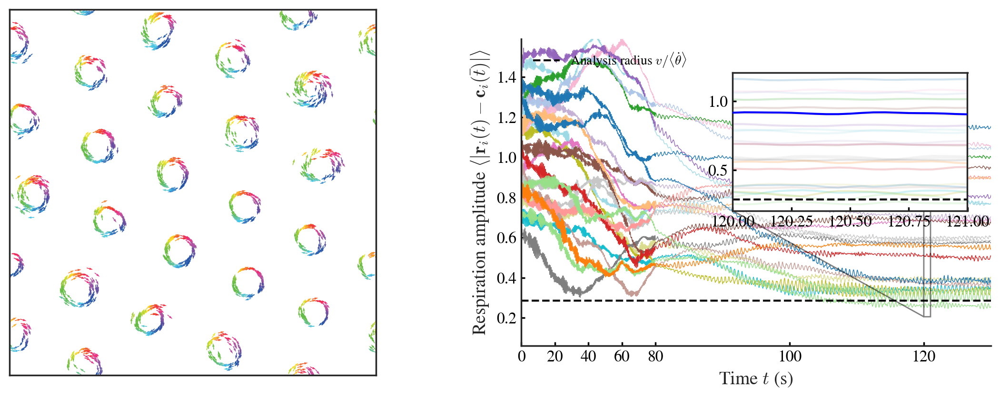

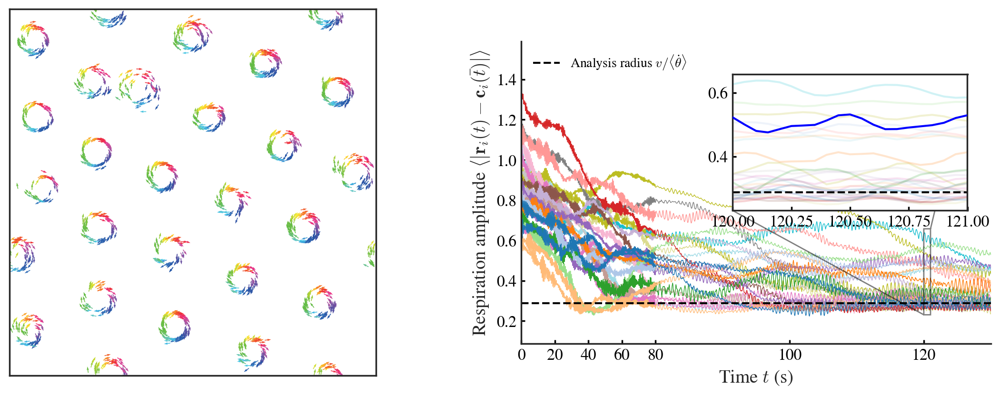

In [4]:
for sa1 in tqdm(sas):

    model1 = sa1.model
    shift = np.array([0., 0.])

    classes, centers = sa1.calc_classes_and_centers(classDistance=0.5, lookIdx=-1)
    centers = np.mod(centers + shift, model1.boundaryLength)

    classCenters: List[np.ndarray] = []
    for c in classes:
        singleClassCenters = centers[c]

        maxDeltaX = np.abs(singleClassCenters[:, 0] - singleClassCenters[:, 0, np.newaxis]).max()
        subXShift = model1.halfBoundaryLength if maxDeltaX > model1.halfBoundaryLength else 0
        maxDeltaY = np.abs(singleClassCenters[:, 1] - singleClassCenters[:, 1, np.newaxis]).max()
        subYShift = model1.halfBoundaryLength if maxDeltaY > model1.halfBoundaryLength else 0

        singleClassCenters = np.mod(singleClassCenters - np.array([subXShift, subYShift]), model1.boundaryLength)
        classCenter = np.mod(singleClassCenters.mean(axis=0) + np.array([subXShift, subYShift]), model1.boundaryLength)
        classCenters.append(classCenter)
    classCenters: np.ndarray = np.array(classCenters)

    edges, ajdClassCenters = sa1.calc_nearby_edges(classCenters=classCenters, stdMulti=0.3)

    totalTvRadius = list()
    step = 1

    for idx, singleClass in enumerate(classes):
        subPositionX = sa1.totalPositionX[::step, singleClass, :]
        classCenter = classCenters[idx]
        tvMaxRadius = sa1.calc_replative_distance(subPositionX, classCenter).mean(axis=1)
        totalTvRadius.append(tvMaxRadius)

    analysisRadius = sa1.model.speedV / np.abs(sa1.model.strengthK * np.sin(sa1.model.phaseLagA0))
    # analysisRadius = sa.model.speedV / np.abs(sa.model.strengthK)
    tRanges = (np.arange(0, len(totalTvRadius[0])) * sa1.model.shotsnaps * step * sa1.model.dt)


    fig, axs = plt.subplots(1, 2, figsize=(14, 5))
    ax1: plt.Axes = axs[0]
    ax2: plt.Axes = axs[1]

    sa1.plot_spatial(ax=ax1)
    ax1.set_aspect("equal")
    ax1.set_xticks([])
    ax1.set_yticks([])

    colors = plt.cm.tab20(np.linspace(1, 0, len(totalTvRadius)))
    for i, tvRadius in enumerate(totalTvRadius[:]):
        ax2.plot(tRanges, tvRadius, alpha=1, lw=0.5, color=colors[i])

    ax2.axhline(analysisRadius, color="black", lw=1.5, ls="--", label=r"Analysis radius $v/\langle\dot{\theta}\rangle$")

    ax2.tick_params(length=3, direction="in")
    ax2.set_xlabel("Time $t$ (s)", fontsize=14)
    ax2.set_ylabel(r"Respiration amplitude $\left< \left| \mathbf{r}_i(t)-\mathbf{c}_i(\bar{t}) \right| \right> $", fontsize=14)
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    ax2.grid()
    ax2.set_xlim(0, 130)
    ax2.set_ylim(None, 1.59)
    ax2.legend(ncols=2, fontsize=10, loc="upper left", frameon=False)

    axTide = ax2.inset_axes([0.45, 0.44, 0.5, 0.45])

    left = 120
    right = left + 1
    selectWindow = (tRanges >= left) & (tRanges <= right)

    meanFreqs = []
    for i, tvRadius in enumerate(totalTvRadius[:]):
        if i == 15:  # 2
            zorder, alpha, color = 100, 1, "blue"
        else:
            zorder, alpha, color = 1, 0.2, colors[i]
        axTide.plot(tRanges[selectWindow], tvRadius[selectWindow], alpha=alpha, lw=1.5, 
                    color=color, ls="-", zorder=zorder)

    axTide.axhline(analysisRadius, color="black", lw=1.5, ls="--")

    ax2.indicate_inset_zoom(axTide, linewidth=1, edgecolor="black")
    axTide.tick_params(length=3, direction="in")
    axTide.grid()
    axTide.set_xlim(left, right)
    # axTide.set_xticks([135, 137.5, 140])

    def forward(x):
        return np.where(x < 80, x/2, 40 + (x-80)*2)

    def inverse(x):
        return np.where(x < 40, x*2, 80 + (x-40)/2)

    ax2.set_xscale('function', functions=(forward, inverse))
    ax2.set_aspect(60)

    plt.show()